# Run EnergyCommunity model

This notebook describes a simple example of how to use EnergyCommunity.jl.

We propose a possible energy community with 3 users and we show the benefits of the EnergyCommunity.
In this notebook, we will create an Energy Community (`COperative (CO)` model in `EnergyCommunity.jl`) and compare it with a base case system where no coordination among users apply. The non-cooperative model is implemented in `EnergyCommunity.jl` as the `Non-Cooperative (NC)` model.

This notebook is adapted from examples in [EnergyCommunity.jl](https://github.com/SPSUnipi/EnergyCommunity.jl) package, licensed CC-BY 4.0.

## Initialization

### Load dependencies

In [1]:
# Activate the environment
using Pkg
Pkg.activate("..")

  Activating project at `c:\Users\Davide\git\gitdf\Teaching\Exercises\julia`


In [2]:
using EnergyCommunity, JuMP
using HiGHS, Plots

### Set input parameters

In [3]:
input_file = "./data/energy_community_model.yml"  # Input file

output_file_isolated = "./outputs/output_file_NC.xlsx"  # Output file - model users alone
output_plot_isolated = "./outputs/Img/plot_user_{:s}_NC.png"  # Output png file of plot - model users alone

output_file_combined = "./outputs/output_file_EC.xlsx"  # Output file - model Energy community
output_plot_combined = "./outputs/Img/plot_user_{:s}_EC.pdf"  # Output png file of plot - model energy community

output_plot_sankey_agg = "./outputs/Img/sankey_EC.png"  # Output plot of the sankey plot related to the aggregator case
output_plot_sankey_noagg = "./outputs/Img/sankey_NC.png"  # Output plot of the sankey plot related to the no aggregator case

"./outputs/Img/sankey_NC.png"

## Optimization of the COperative (CO) Energy Community

In the following we execute the code to optimize a cooperative energy community

In [4]:
# Create the EnergyCommunity model
ECModel = ModelEC(input_file, EnergyCommunity.GroupCO(), HiGHS.Optimizer)

# build the model
build_model!(ECModel)

# optimize the model
optimize!(ECModel)

Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
25416 rows, 16405 cols, 70431 nonzeros
22029 rows, 14129 cols, 69549 nonzeros
Presolve : Reductions: rows 22029(-5619); columns 14129(-5500); elements 69549(-14079)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Ph1: 0(0) 0s
      26186     1.2064931899e+06 Pr: 0(0); Du: 0(6.75193e-12) 2s
Solving the original LP from the solution after postsolve
Model   status      : Optimal
Simplex   iterations: 26186
Objective value     : -1.2064931899e+06
HiGHS run time      :          2.75


An Energy Community Model
Energy Community problem for a Cooperative Model
User set: ["user1", "user2", "user3"]


Solved model


In [5]:
# print summary
print_summary(ECModel)

┌ Info: List of users not specified: all users selected
└ @ EnergyCommunity C:\Users\Davide\.julia\packages\EnergyCommunity\hQmRT\src\utils.jl:116



RESULTS - AGGREGATOR


NPV Agg [k€]      :  0.00e+00
SWtot [k€]        : -1.21e+03
SWus [k€]         : -1.21e+03


ESha [MWh]        :  3.70e+00


RESULTS - USER
USER              :     user1,     user2,     user3


PV                :  4.08e+01,  4.67e+01,  2.27e+01
batt              

:  0.00e+00,  3.33e+00,  5.10e+00
conv              :  0.00e+00,  3.33e+00,  5.10e+00
wind              :  0.00e+00,  0.00e+00,  7.35e+01
NPV [k€]          : -5.71e+02, -2.30e+02, -4.51e+02
CAPEX [k€]        :  6.94e+01,  6.73e+01,  2.60e+02


OPEX [k€]         :  1.22e+00,  1.42e+00,  2.92e+00
YBill [k€]        : -3.30e+01, -1.07e+01, -1.26e+01


Energy flows
USER              :     user1,     user2,     user3


PtotPusP [MWh]    :  3.31e-01,  5.05e+00,  2.45e+00
PtotPusN [MWh]    :  2.24e+01,  7.70e+00,  5.63e+00


PconvP [MWh]      :  0.00e+00,  2.76e-01,  3.68e-01
PconvN [MWh]      :  0.00e+00,  3.00e-01,  4.00e-01


Pren [MWh]        :  8.46e+00,  9.54e+00,  2.13e+01


Load [MWh]        :  3.05e+01,  1.22e+01,  2.45e+01


In [6]:
# plots
plot(ECModel, output_plot_combined)

In [7]:
# save summary
save_summary(ECModel, output_file_isolated)

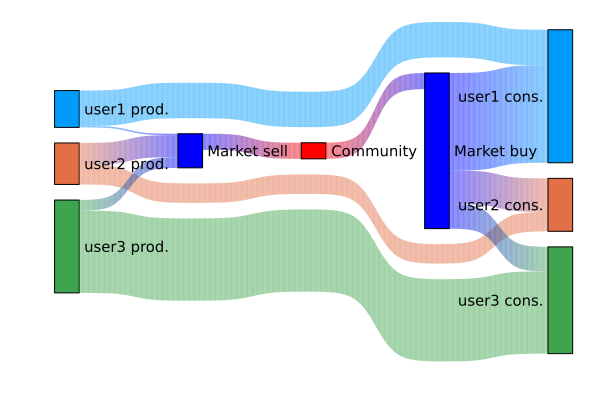

In [8]:
plot_sankey(ECModel)

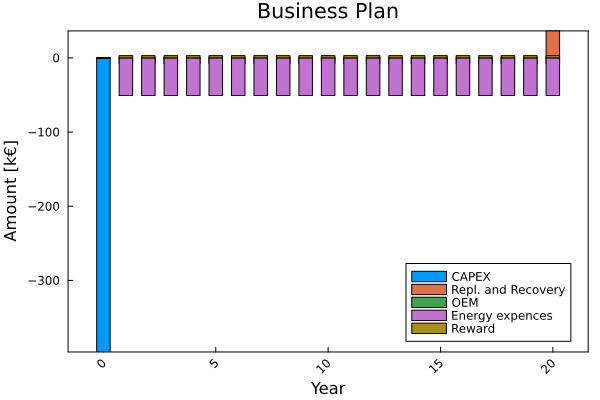

In [9]:
business_plan_plot(ECModel)

## Optimization of the Non-Cooperative (NC) Energy Community

In the following we execute the code to optimize a non-cooperative energy community

In [10]:
# Create the EnergyCommunity model
NCModel = ModelEC(ECModel, EnergyCommunity.GroupNC())

# build the model
build_model!(NCModel)

# optimize the model
optimize!(NCModel)

Running HiGHS 1.6.0: Copyright (c) 2023 HiGHS under MIT licence terms
Presolving model
23112 rows, 15253 cols, 62206 nonzeros
19274 rows, 12526 cols, 60962 nonzeros
19274 rows, 12526 cols, 60962 nonzeros
Presolve : Reductions: rows 19274(-4918); columns 12526(-4798); elements 60962(-5386)
Solving the presolved LP
Using EKK dual simplex solver - serial
  Iteration        Objective     Infeasibilities num(sum)
          0     0.0000000000e+00 Ph1: 0(0) 0s
      17996     1.2227418941e+06 Pr: 0(0); Du: 0(1.06581e-13) 1s
Solving the original LP from the solution after postsolve
Model   status      : Optimal
Simplex   iterations: 17996
Objective value     : -1.2227418941e+06
HiGHS run time      :          1.45


An Energy Community Model
Energy Community problem for a Non-Cooperative Model
User set: ["user1", "user2", "user3"]


Solved model


In [11]:
# print summary
print_summary(NCModel)


RESULTS - AGGREGATOR
USER              :     user1,     user2,     user3
load              :  0.00e+00,  0.00e+00,  0.00e+00
PV                :  5.00e+01,  2.55e+01,  4.40e+01


batt              :  0.00e+00,  1.97e+00,  3.72e+00
conv              :  0.00e+00,  1.97e+00,  3.72e+00
wind              :  0.00e+00,  0.00e+00,  3.49e+01
NPV [k€]          : -5.64e+02, -2.23e+02, -4.36e+02
CAPEX [k€]        :  8.50e+01,  3.69e+01,  1.77e+02


OPEX [k€]         :  1.50e+00,  7.78e-01,  2.39e+00
YBill [k€]        : -3.16e+01, -1.22e+01, -1.72e+01


Energy flows
USER              :     user1,     user2,     user3
PtotPusP [MWh]    :  1.09e+00,  1.38e+00,  2.26e+00
PtotPusN [MWh]    :  2.12e+01,  8.27e+00,  9.79e+00


PconvP [MWh]      :  0.00e+00,  1.18e-01,  2.81e-01
PconvN [MWh]      :  0.00e+00,  1.28e-01,  3.05e-01


Pren [MWh]        :  1.04e+01,  5.28e+00,  1.70e+01


Load [MWh]        :  3.05e+01,  1.22e+01,  2.45e+01


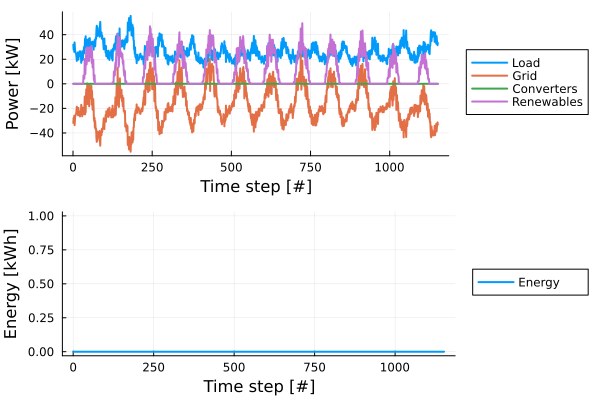

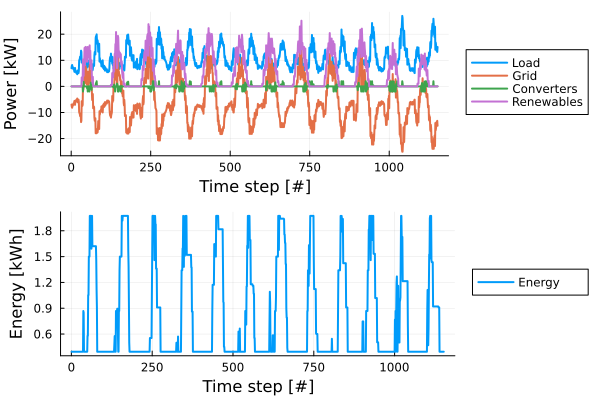

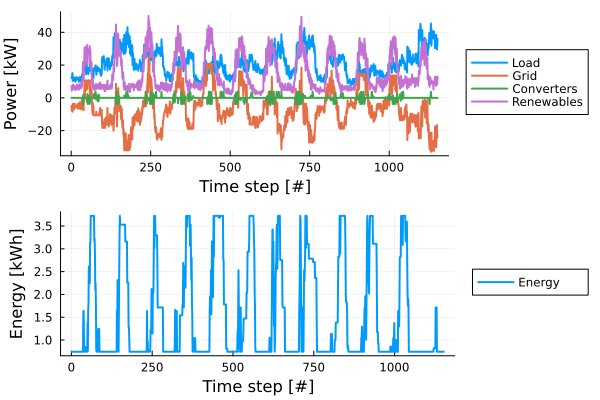

In [12]:
# plots
plot(NCModel, output_plot_isolated)

In [13]:
# save summary
save_summary(NCModel, output_file_isolated)

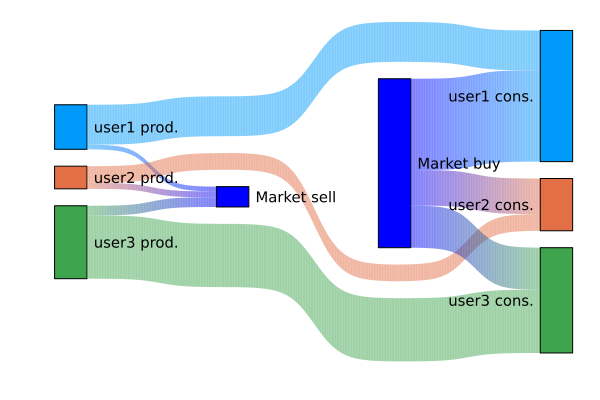

In [14]:
plot_sankey(NCModel)

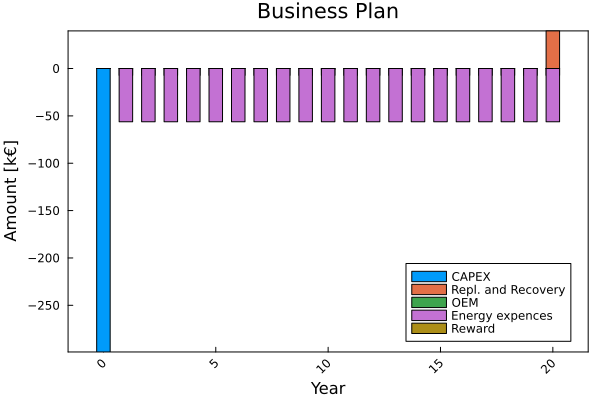

In [15]:
business_plan_plot(NCModel)